# Solução do Problema do Caixeiro Viajante
## Tech Challenge FIAP - IA para devs

Este notebook implementa uma solução para o Problema do Caixeiro Viajante usando uma abordagem de Algoritmo Genético.

## Descrição do Problema
O Problema do Caixeiro Viajante (PCV) é um problema clássico de otimização onde precisamos encontrar a menor rota possível que visite cada cidade exatamente uma vez e retorne à cidade inicial.

## Implementação
Utilizaremos um algoritmo genético com os seguintes componentes:
- Geração aleatória da população
- Cálculo de aptidão baseado na distância da rota
- Crossover ordenado para gerar novas soluções
- Mutação para manter a diversidade
- Elitismo para preservar a melhor solução

In [1]:
!pip3 install numpy matplotlib

In [2]:
# Importação das bibliotecas necessárias
import random
import math
import copy 
from typing import List, Tuple
import matplotlib.pyplot as plt
import numpy as np

# Para garantir reprodutibilidade dos resultados
random.seed(42)

In [47]:
# Problemas de exemplo com diferentes quantidades de cidades
default_problems = {
    5: [(733, 251), (706, 87), (546, 97), (562, 49), (576, 253)],
    10: [(470, 169), (602, 202), (754, 239), (476, 233), (468, 301), 
         (522, 29), (597, 171), (487, 325), (746, 232), (558, 136)],
    12: [(728, 67), (560, 160), (602, 312), (712, 148), (535, 340),
         (720, 354), (568, 300), (629, 260), (539, 46), (634, 343),
         (491, 135), (768, 161)],
    15: [(512, 317), (741, 72), (552, 50), (772, 346), (637, 12),
         (589, 131), (732, 165), (605, 15), (730, 38), (576, 216),
         (589, 381), (711, 387), (563, 228), (494, 22), (787, 288)],
    100: [
       (-74.006, 40.714),  # New York
        (-118.243, 34.052),  # Los Angeles
        (151.207, -33.867),  # Sydney
        (2.352, 48.856),    # Paris
        (139.691, 35.689),  # Tokyo
        (-43.172, -22.906),  # Rio de Janeiro
        (37.617, 55.755),   # Moscow
        (-79.383, 43.653),  # Toronto
        (28.979, 41.008),   # Istanbul
        (121.465, 31.230),  # Shanghai
        (103.851, 1.290),   # Singapore
        (-58.381, -34.603),  # Buenos Aires
        (13.404, 52.520),   # Berlin
        (-0.127, 51.507),   # London
        (77.209, 28.613),   # New Delhi
        (31.233, 30.044),   # Cairo
        (-99.133, 19.432),  # Mexico City
        (116.407, 39.904),  # Beijing
        (12.496, 41.902),   # Rome
        (-70.648, -33.459),  # Santiago
        (144.963, -37.814),  # Melbourne
        (-3.703, 40.416),   # Madrid
        (55.270, 25.204),   # Dubai
        (126.978, 37.566),  # Seoul
        (100.501, 13.756),  # Bangkok
        (18.423, -33.918),  # Cape Town
        (-77.042, -12.046),  # Lima
        (4.897, 52.377),    # Amsterdam
        (174.763, -36.848),  # Auckland
        (120.979, 14.599),  # Manila
        (-6.249, 53.349),   # Dublin
        (101.686, 3.139),   # Kuala Lumpur
        (73.856, 18.520),   # Pune
        (-75.578, 6.244),   # Medellin
        (30.523, 50.450),   # Kiev
        (114.109, 22.396),  # Hong Kong
        (-90.548, 14.628),  # Guatemala City
        (7.491, 9.072),     # Abuja
        (106.845, -6.208),  # Jakarta
        (85.324, 27.717),   # Kathmandu
        (-66.903, 10.480),  # Caracas
        (32.858, -13.133),  # Lusaka
        (35.495, 33.888),   # Beirut
        (69.169, 34.555),   # Kabul
        (44.391, 33.315),   # Baghdad
        (-17.384, 14.716),  # Dakar
        (90.407, 23.811),   # Dhaka
        (36.817, -1.292),   # Nairobi
        (47.481, -18.879),  # Antananarivo
        (51.421, 35.689),   # Tehran
        (138.933, -34.928),  # Adelaide
        (115.857, -31.950),  # Perth
        (72.877, 19.075),   # Mumbai
        (88.363, 22.572),   # Kolkata
        (80.278, 13.088),   # Chennai
        (-84.388, 33.749),  # Atlanta
        (-87.629, 41.878),  # Chicago
        (-71.058, 42.360),  # Boston
        (-122.419, 37.774),  # San Francisco
        (-95.369, 29.760),  # Houston
        (-80.191, 25.761),  # Miami
        (-123.121, 49.282),  # Vancouver
        (-114.070, 51.048),  # Calgary
        (-73.567, 45.501),  # Montreal
        (-78.878, -2.203),  # Quito
        (-57.333, -25.282),  # Asuncion
        (-56.164, -34.901),  # Montevideo
        (23.727, 37.983),   # Athens
        (19.040, 47.497),   # Budapest
        (21.012, 52.229),   # Warsaw
        (14.514, 46.056),   # Ljubljana
        (16.373, 48.208),   # Vienna
    ]
}

In [4]:
def plot_route(cities: List[Tuple[float, float]], route: List[Tuple[float, float]], title: str = "Rota do Caixeiro Viajante"):
    """Plotar a rota do caixeiro viajante."""
    plt.figure(figsize=(10, 10))
    
    # Plotar cidades
    x = [city[0] for city in cities]
    y = [city[1] for city in cities]
    plt.scatter(x, y, c='red', s=100)
    
    # Plotar rota
    route_x = [city[0] for city in route]
    route_y = [city[1] for city in route]
    
    # Adicionar retorno à cidade inicial
    route_x.append(route_x[0])
    route_y.append(route_y[0])
    
    plt.plot(route_x, route_y, 'b-')
    
    # Adicionar números das cidades
    for i, (x, y) in enumerate(cities):
        plt.annotate(f'Cidade {i}', (x, y), xytext=(5, 5), textcoords='offset points')
    
    plt.title(title)
    plt.grid(True)
    plt.show()

In [50]:
def calculate_distance(city1: Tuple[float, float], city2: Tuple[float, float]) -> float:
    """Calcular a distância euclidiana entre duas cidades."""
    return math.sqrt((city1[0] - city2[0])**2 + (city1[1] - city2[1])**2)

def calculate_route_distance(route: List[Tuple[float, float]]) -> float:
    """Calcular a distância total de uma rota."""
    total_distance = 0
    for i in range(len(route)):
        total_distance += calculate_distance(route[i], route[(i + 1) % len(route)])
    return total_distance

def calculate_fitness(route: List[Tuple[float, float]]) -> float:
    """Calcular a aptidão de uma rota (inverso da distância total)."""
    return calculate_route_distance(route)

def generate_random_population(cities: List[Tuple[float, float]], population_size: int) -> List[List[Tuple[float, float]]]:
    """Gerar uma população inicial aleatória."""
    population = []
    for _ in range(population_size):
        # Criar uma cópia aleatória das cidades
        new_route = cities.copy()
        random.shuffle(new_route)
        population.append(new_route)
    return population

def sort_population(population: List[List[Tuple[float, float]]], fitness_values: List[float]) -> Tuple[List[List[Tuple[float, float]]], List[float]]:
    """Ordenar população por aptidão (menor distância primeiro)."""
    sorted_pairs = sorted(zip(population, fitness_values), key=lambda x: x[1])
    return zip(*sorted_pairs)

def order_crossover(parent1: List[Tuple[float, float]], parent2: List[Tuple[float, float]]) -> List[Tuple[float, float]]:
    """Realizar crossover ordenado entre dois pais."""
    size = len(parent1)
    # Escolher dois pontos de corte aleatórios
    start, end = sorted(random.sample(range(size), 2))
    
    # Criar filho com segmento do primeiro pai
    child = [None] * size
    for i in range(start, end + 1):
        child[i] = parent1[i]
    
    # Preencher o resto com genes do segundo pai, mantendo a ordem
    remaining_cities = [city for city in parent2 if city not in child[start:end + 1]]
    j = 0
    for i in range(size):
        if child[i] is None:
            child[i] = remaining_cities[j]
            j += 1
    
    return child

def mutate(route: List[Tuple[float, float]], probability: float) -> List[Tuple[float, float]]:
    """Aplicar mutação em uma rota (troca de duas cidades)."""
    if random.random() < probability:
        i, j = random.sample(range(len(route)), 2)
        route[i], route[j] = route[j], route[i]
    return route

In [51]:
def solve_tsp(cities: List[Tuple[float, float]], 
              population_size: int = 100,
              n_generations: int = 100,
              mutation_probability: float = 0.3,
              plot_progress: bool = True) -> Tuple[List[Tuple[float, float]], float, List[float]]:
    """Resolver o PCV usando algoritmo genético e retornar melhor rota, distância e progresso."""
    
    # Criar população inicial
    population = generate_random_population(cities, population_size)
    
    # Acompanhar progresso
    best_fitness_values = []
    best_solutions = []
    
    for generation in range(n_generations):
        # Calcular aptidão para todos os indivíduos
        population_fitness = [calculate_fitness(individual) for individual in population]
        
        # Ordenar população por aptidão
        population, population_fitness = sort_population(population, population_fitness)
        
        # Armazenar melhor solução
        best_fitness = population_fitness[0]
        best_solution = population[0]
        
        best_fitness_values.append(best_fitness)
        best_solutions.append(best_solution)
        
        # Criar nova população
        new_population = [population[0]]  # Elitismo
        
        while len(new_population) < population_size:
            # Seleção
            parent1, parent2 = random.choices(population[:10], k=2)
            
            # Crossover
            child = order_crossover(parent1, parent2)
            
            # Mutação
            child = mutate(child, mutation_probability)
            
            new_population.append(child)
        
        population = new_population
        
        if plot_progress and generation % 10 == 0:
            plot_route(cities, best_solution, 
                      f"Geração {generation}: Distância = {best_fitness:.2f}")
    
    return best_solutions[-1], best_fitness_values[-1], best_fitness_values

## Testando a Implementação

Vamos resolver o PCV para diferentes tamanhos de problema e visualizar os resultados.

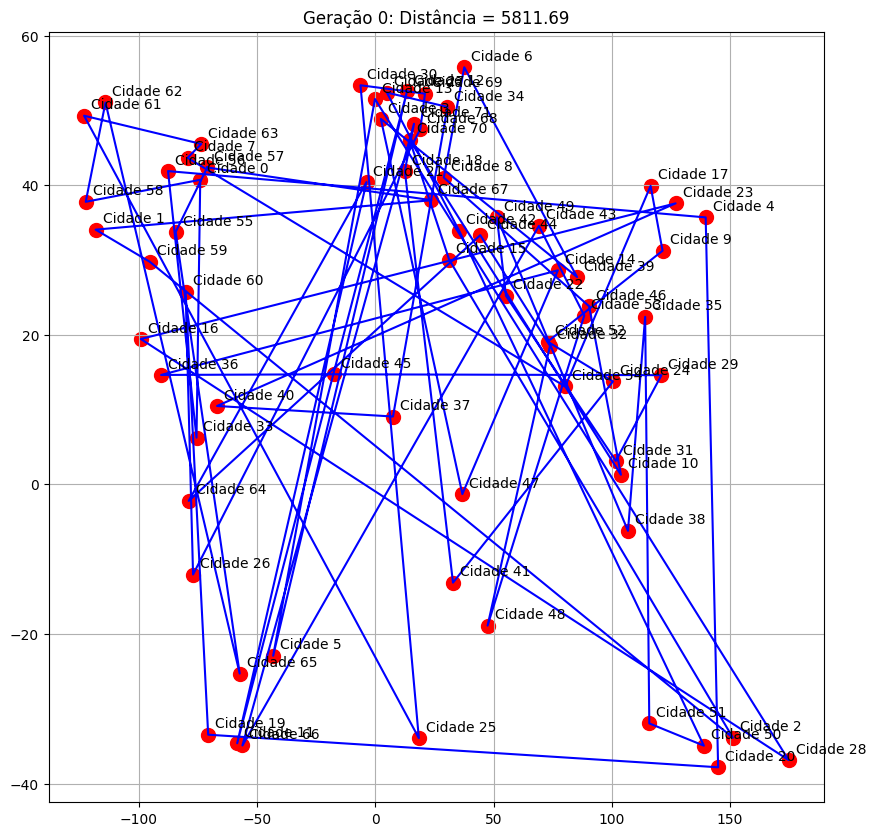

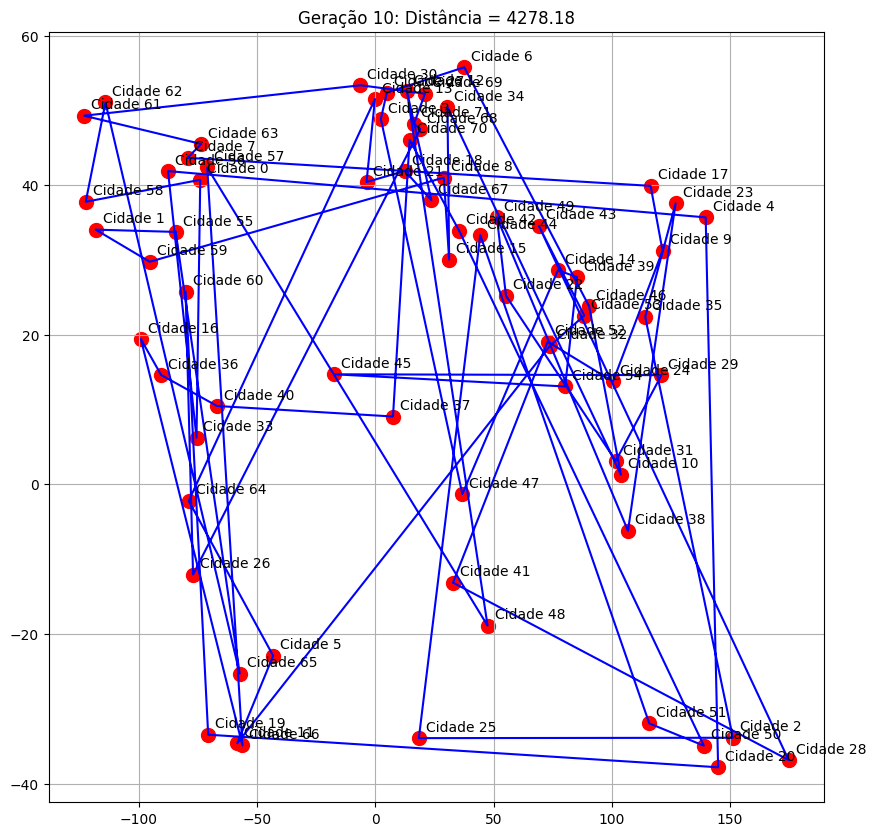

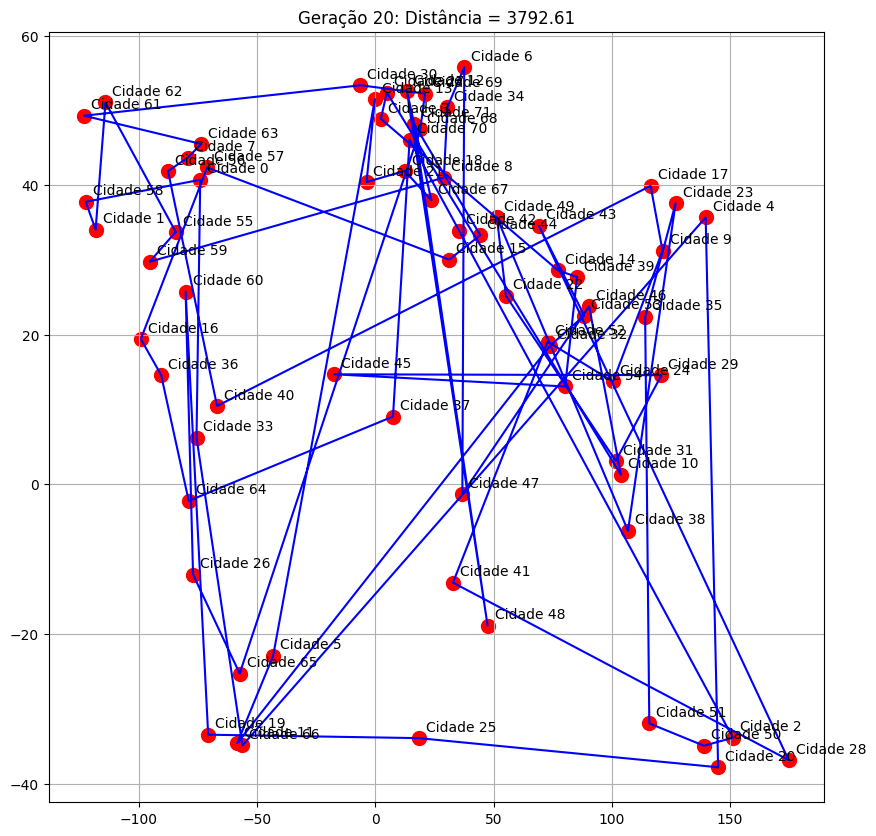

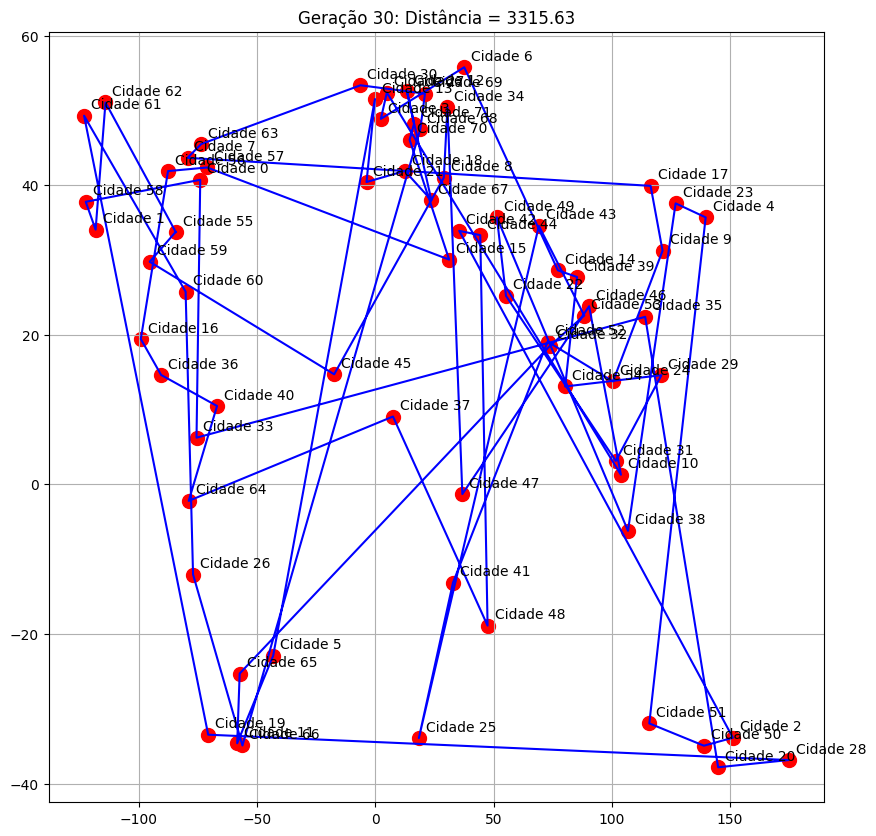

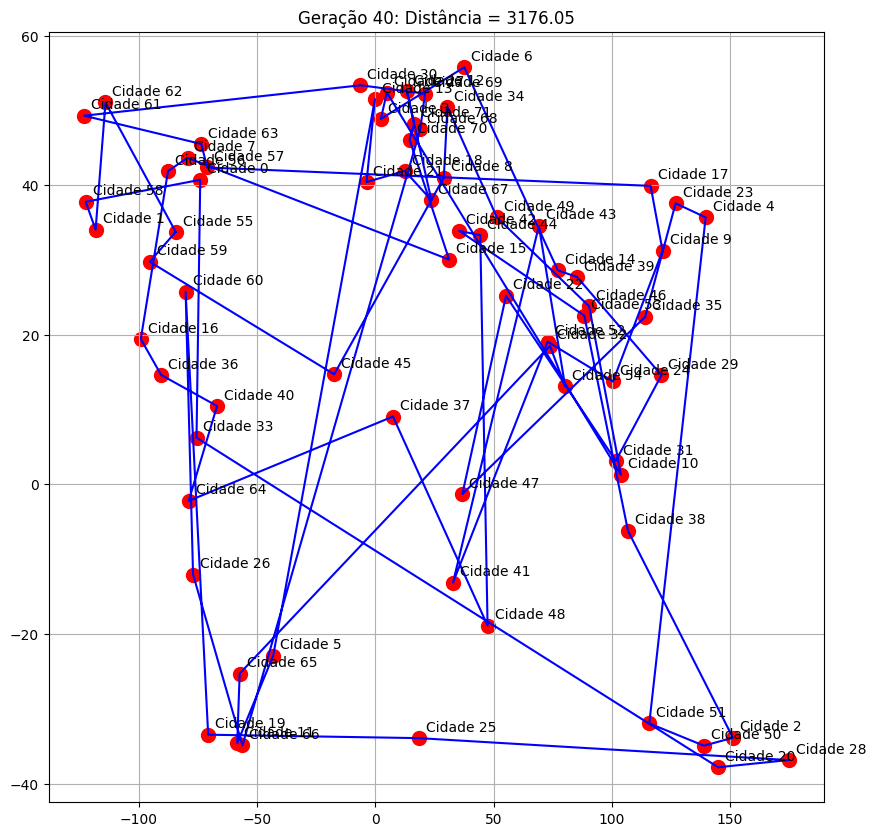

...

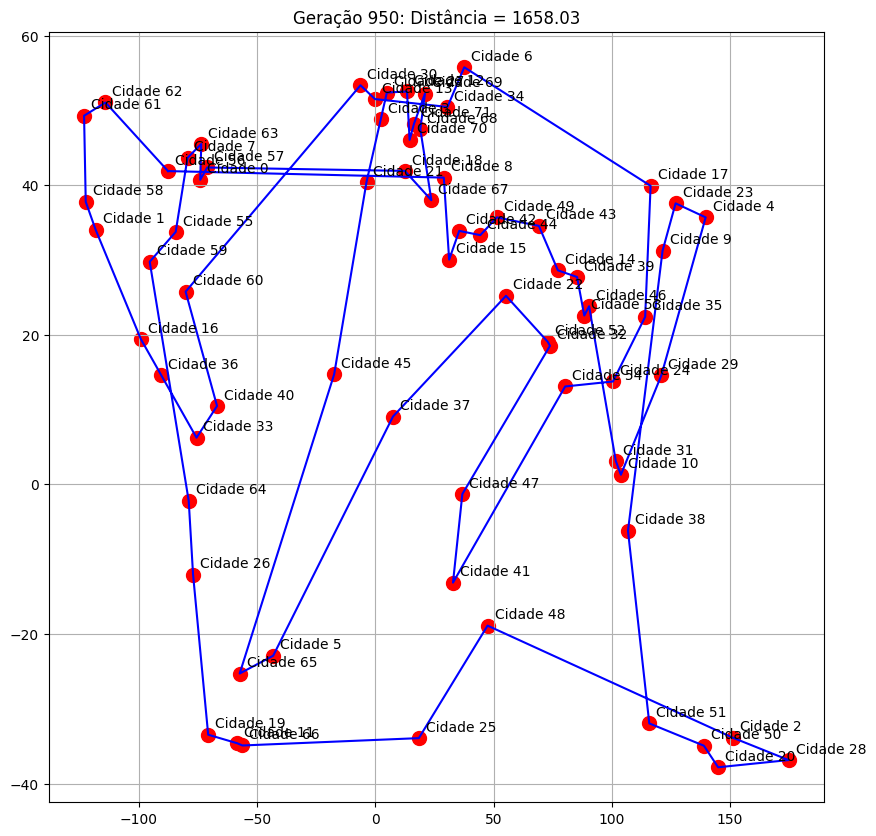

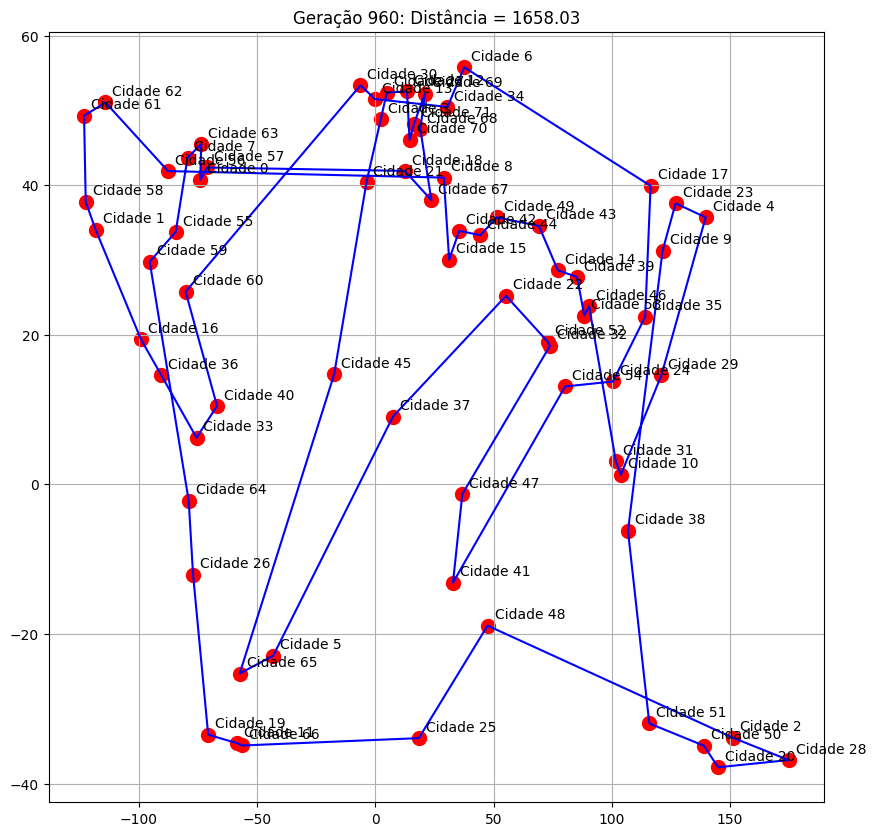

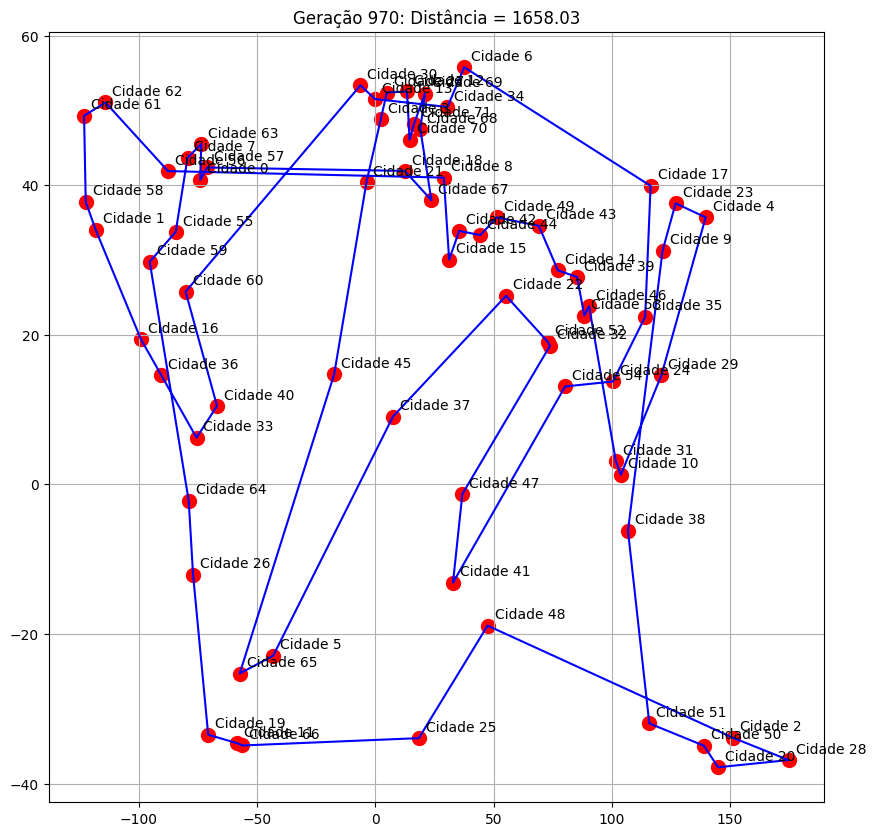

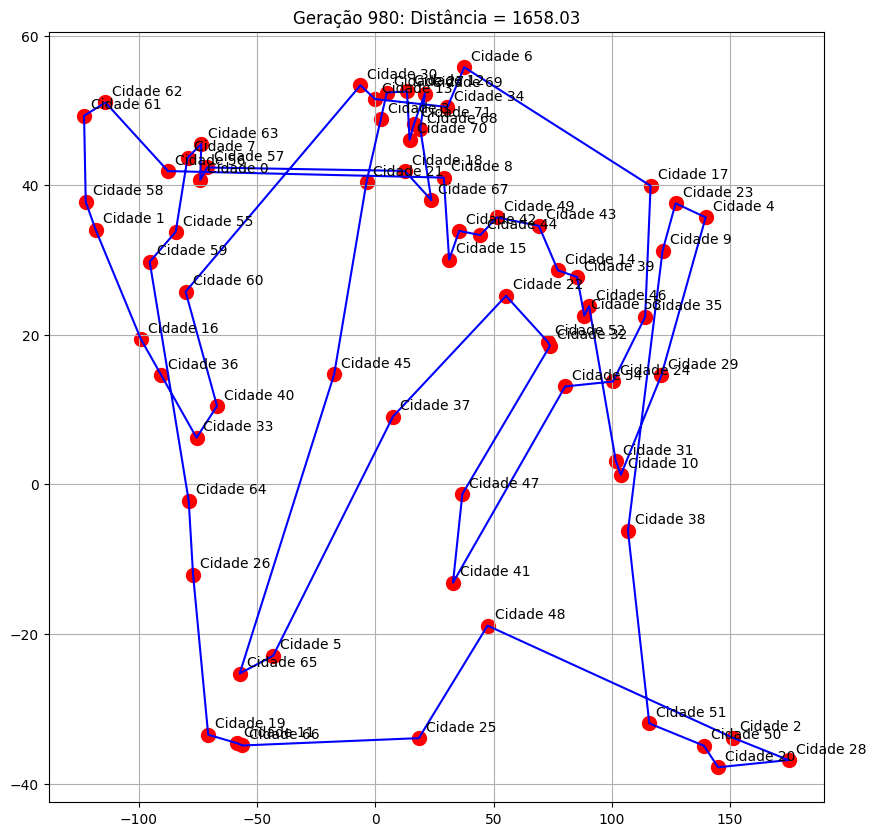

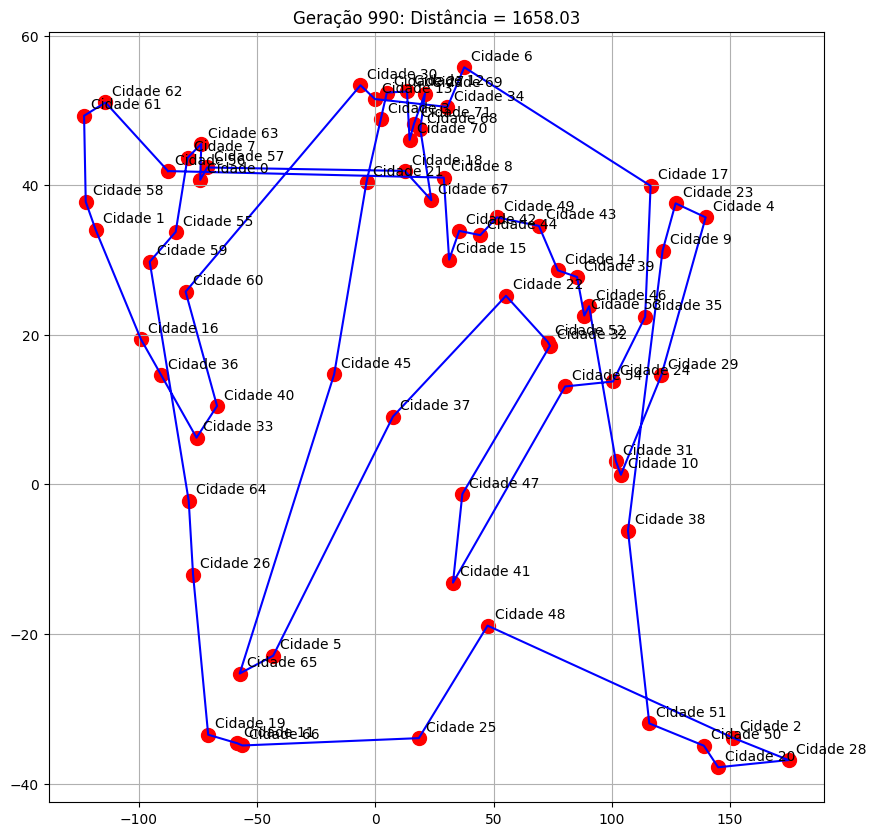

In [52]:
# Teste com 10 cidades
cities = default_problems[100]
best_route, best_distance, progress = solve_tsp(
    cities,
    population_size=100,  # Tamanho da população
    n_generations=1000,    # Número de gerações
    mutation_probability=0.3,  # Probabilidade de mutação
    plot_progress=True    # Mostrar progresso visual
)

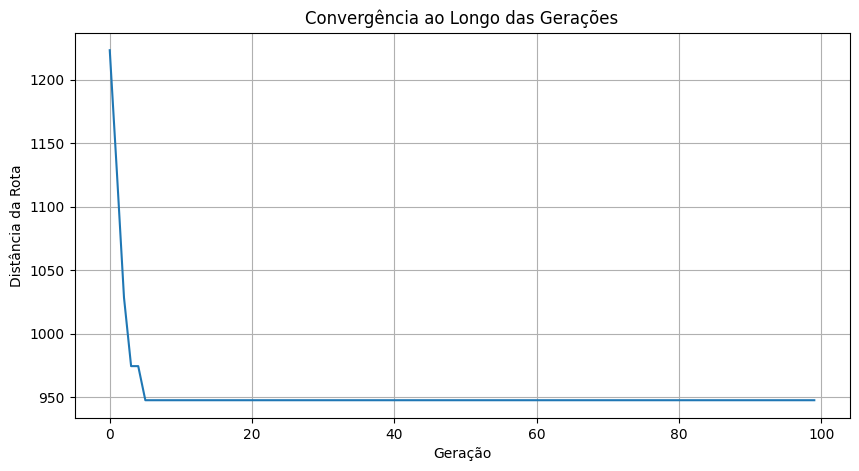

Distância final: 947.63


In [10]:
# Plotar convergência
plt.figure(figsize=(10, 5))
plt.plot(progress)
plt.title('Convergência ao Longo das Gerações')
plt.xlabel('Geração')
plt.ylabel('Distância da Rota')
plt.grid(True)
plt.show()

print(f"Distância final: {best_distance:.2f}")